In [260]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
# 加载数据集
train_df = pd.read_csv('train_data.csv')
test_df = pd.read_csv('test_data.csv')

In [261]:
train_df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011/1/1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011/1/1,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011/1/1,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011/1/1,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011/1/1,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [262]:
train_df['dteday'].dtype

dtype('O')

In [263]:
# 将 'dteday' 列转换为日期时间格式
train_df['dteday'] = pd.to_datetime(train_df['dteday'], format='%Y/%m/%d')
test_df['dteday'] = pd.to_datetime(test_df['dteday'], format='%Y/%m/%d')
train_df.shape

(15216, 17)

In [264]:
train_df.dropna(inplace=True)
test_df.dropna(inplace=True)

train_df.shape
# Instantiate the model
input_dim = 13
hidden_dim = 96
input_seq = 96
output_seq = 240
layer_dim = 2  # Only one layer
output_dim = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [265]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
# Selecting the relevant features and the target variable
features = ['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'weathersit', 
            'temp', 'atemp', 'hum', 'windspeed', 'cnt']
target = 'cnt'

# Splitting the training set into training and validation sets
train_df.sort_values(by='dteday', inplace=True)
test_df.sort_values(by='dteday', inplace=True)
x_train = train_df[features]
y_train = train_df[target]
x_test = test_df[features]
y_test = test_df[target]
# Standardizing the features
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.fit_transform(x_test)
# Creating sequences for LSTM
def create_sequences(x, y, time_steps=96, seq_length=240):
    xs, ys = [], []
    for i in range(len(x) - time_steps - seq_length):
        xs.append(x[i:(i + time_steps), :])
        ys.append(y[i + time_steps: i + time_steps + seq_length])
    return np.array(xs), np.array(ys)

# Create sequences before splitting the data
x_train_seq, y_train_seq = create_sequences(x_train_scaled, y_train, input_seq, output_seq)
x_test_seq, y_test_seq = create_sequences(x_test_scaled, y_test, input_seq, output_seq)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(x_train_seq, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_seq, dtype=torch.float32).view(-1, output_seq).to(device)
X_test_tensor = torch.tensor(x_test_seq, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32).view(-1, output_seq).to(device)
# Create TensorDataset for training and validation
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
# DataLoader for batch training
batch_size = 32
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [266]:
# 96小时短期预测模型
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, input_seq_len, output_seq_len):
        super(LSTMModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim
        self.input_seq_len = input_seq_len
        self.output_seq_len = output_seq_len
        # LSTM Layer
        self.lstm = nn.LSTM(input_dim, hidden_dim, layer_dim, batch_first=True)
        
        # Linear Layer to generate the output for each time step
        self.linear = nn.Linear(hidden_dim, output_dim)
    
    def forward(self, x):
        # Initialize hidden state and cell state with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(x.device)
        
        # LSTM forward pass
        out, (hn, cn) = self.lstm(x, (h0, c0))
        
        # Apply linear layer to each time step in the sequence
        out = self.linear(out)  # Shape: [batch_size, seq_len, output_dim]
        
        return out


In [267]:
# 240小时长期预测模型
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, layer_dim, output_dim, input_seq_len, output_seq_len):
        super(LSTMModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim
        self.input_seq_len = input_seq_len
        self.output_seq_len = output_seq_len
        self.output_dim = output_dim
        # LSTM Layer
        self.lstm = nn.LSTM(input_dim, hidden_dim, layer_dim, batch_first=True)
        
        # Linear Layer to generate the output for each time step
        self.linear = nn.Linear(hidden_dim, output_dim)

        # Fully connected layer to map from input_seq_len to output_seq_len
        self.fc = nn.Linear(input_seq_len, output_seq_len)
    
    def forward(self, x):
        # Initialize hidden state and cell state with zeros
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim).to(x.device)
        
        # LSTM forward pass
        out, (hn, cn) = self.lstm(x, (h0, c0))
        
        # Apply linear layer to each time step in the sequence
        out = self.linear(out)  # Shape: [batch_size, input_seq_len, output_dim]
        
        # Map output sequence length from input_seq_len (96) to output_seq_len (240)
        out = out.contiguous().view(out.size(0), -1)  # Flatten to [batch_size, input_seq_len * output_dim]
        out = self.fc(out)  # Shape: [batch_size, output_seq_len]
        
        # Reshape output to [batch_size, output_seq_len, output_dim]
        out = out.view(out.size(0), self.output_seq_len, self.output_dim)
        
        return out  # Output shape: [batch_size, output_seq_len, output_dim]

In [268]:
def test(model):
    
    model.eval()
    pred_list = []
    true_list = []
    with torch.no_grad():
        for x,label in test_loader:
            y = model(x).squeeze(-1)
            for row in y.detach().cpu().numpy():
                pred_list.append(list(row))
            for row in label.detach().cpu().numpy():
                true_list.append(list(row))
    return pred_list, true_list

In [269]:
def train():
    lstm_model_torch = LSTMModel(input_dim, hidden_dim, layer_dim, output_dim, input_seq, output_seq).to(device)
    criterion_mse = nn.MSELoss()
    optimizer = optim.Adam(lstm_model_torch.parameters(), lr=0.001)
    Loss = []
    num_epochs = 60
    for epoch in range(num_epochs):
        for x,label in train_loader:
            x = x.to(device)
            outputs = lstm_model_torch(x).squeeze(-1)
            print(outputs.shape, label.shape)
            loss = criterion_mse(outputs, label)
            print('Epoch: ', epoch, 'Loss: ', loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            Loss.append(loss.item())
    torch.save(lstm_model_torch.state_dict(), 'lstm_model_torch'+str(output_dim)+'.pth')
    pred, true = test(lstm_model_torch)
    return pred, true

In [270]:
pred_array = []
for i in range(5):
    pred,true = train()
    pred_array.append(pred)
numpy_array = np.array(pred_array)
print(numpy_array.shape)
np.save('pred_array_lstm.npy', numpy_array)
numpy_array = np.array(true)
print(numpy_array.shape)
np.save('true_lstm.npy', numpy_array)

torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  53509.99609375
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  55948.4609375
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  64047.15234375
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  59766.11328125
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  78368.1015625
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  63370.8203125
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  65630.5390625
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  74779.359375
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  60726.38671875
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  70820.890625
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  57932.27734375
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  55845.26171875
torch.Size([32, 240]) torch.Size([32, 240])
Epoch:  0 Loss:  67304.15625
torch.Size([32, 240]) t

In [271]:
def calculate(pred_array, true_array,i):
    true_values = true_array[i, :]
    mae = np.mean(np.abs(pred_array[i,:] - true_values))
    mse = np.mean((pred_array[i,:] - true_values)**2)
    return mae,mse

In [272]:
def draw_one_sample(pred_array, true_array, i=0):
    pred = pred_array[i]
    true = true_array[i]

    plt.figure(figsize=(8, 4))
    plt.plot(true, label='Target True Values', color='green', marker='o', markersize=3)
    plt.plot(pred, label='Predicted Values', color='red', linestyle='--', marker='x', markersize=3)
    plt.legend()
    plt.title(f'Prediction vs True Values for Sample {i+1}')
    plt.xlabel('Time Steps')
    plt.ylabel('Values')
    plt.grid()
    plt.show()

(1824, 240) (1824, 240)
5轮训练平均值:
测试集上第11个样本的MAE: 164.58101
测试集上第11个样本的MSE: 47718.965


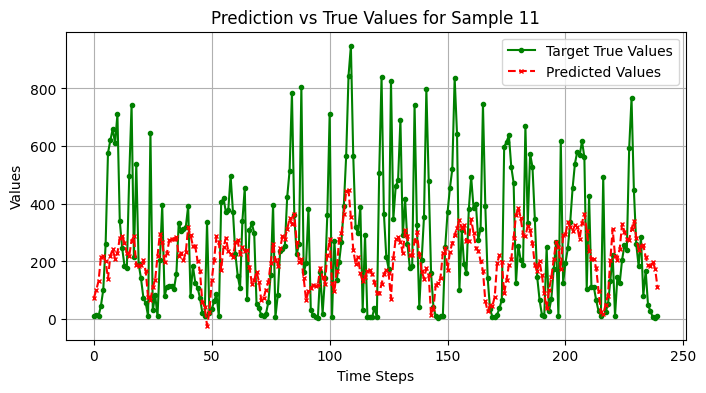

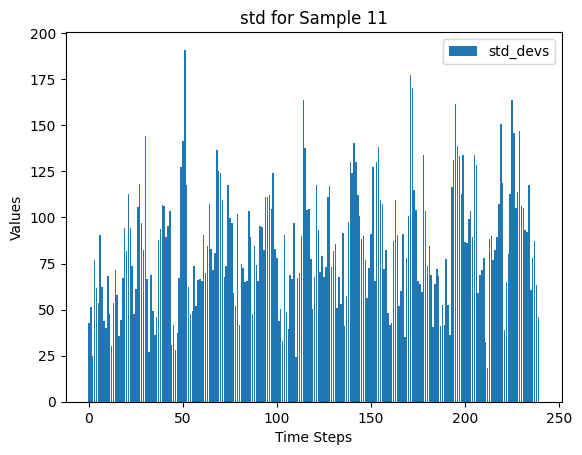

测试集上第211个样本的MAE: 171.19505
测试集上第211个样本的MSE: 58148.598


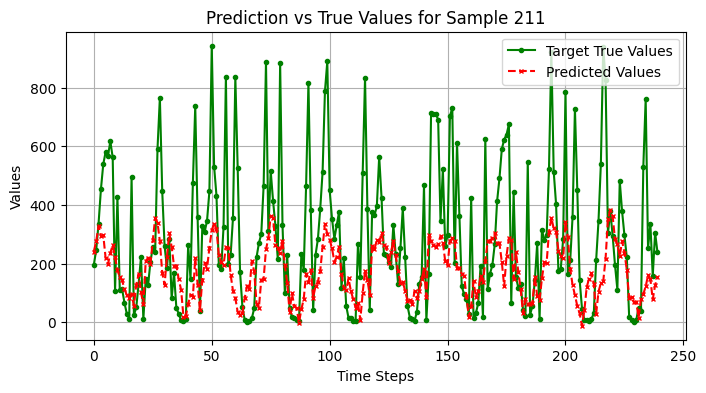

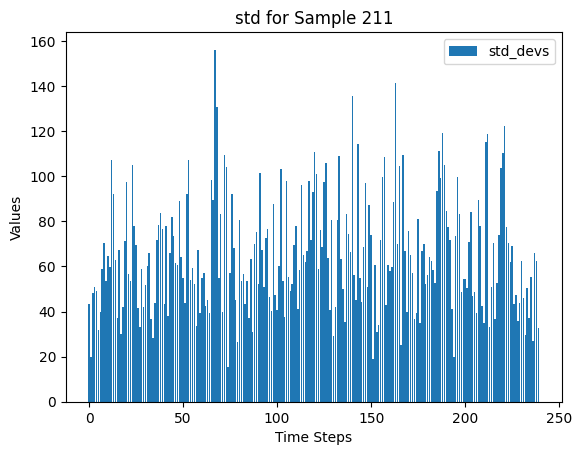

测试集上第411个样本的MAE: 179.73305
测试集上第411个样本的MSE: 60584.812


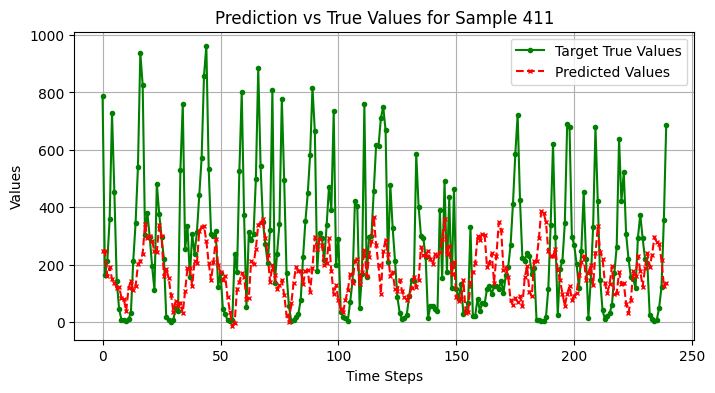

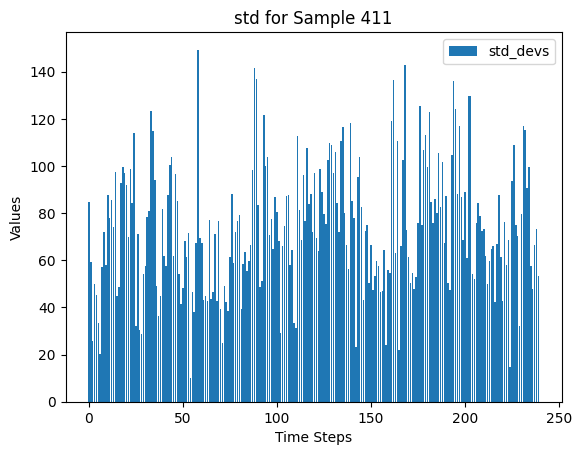

测试集上第611个样本的MAE: 176.59291
测试集上第611个样本的MSE: 48059.184


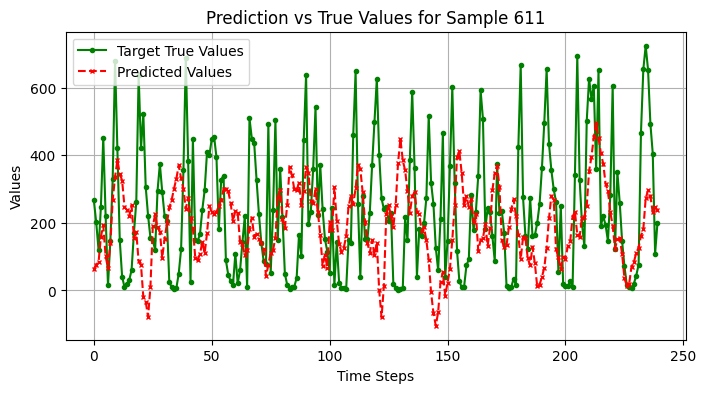

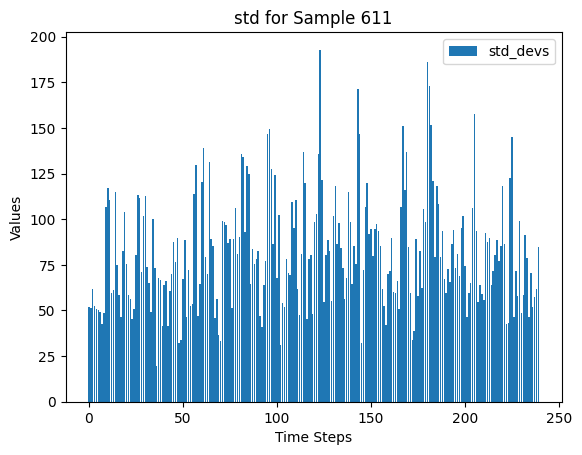

测试集上第811个样本的MAE: 140.2704
测试集上第811个样本的MSE: 32019.848


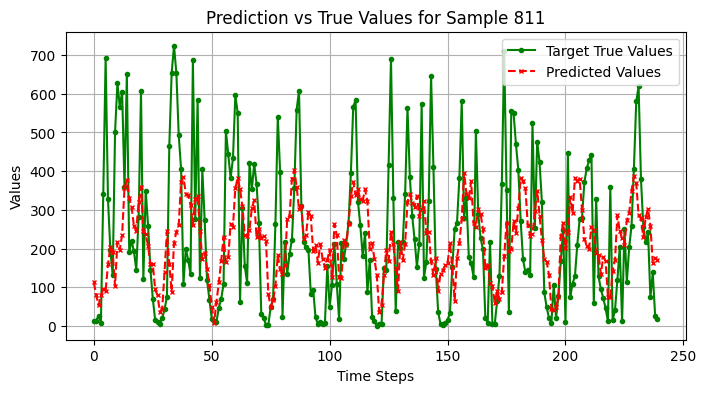

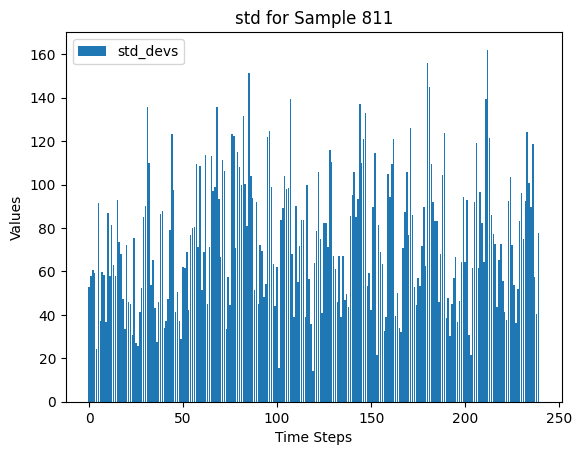

测试集上第1011个样本的MAE: 120.835175
测试集上第1011个样本的MSE: 22454.49


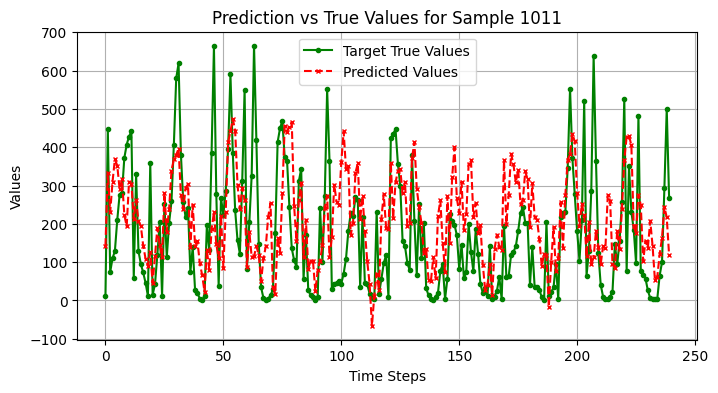

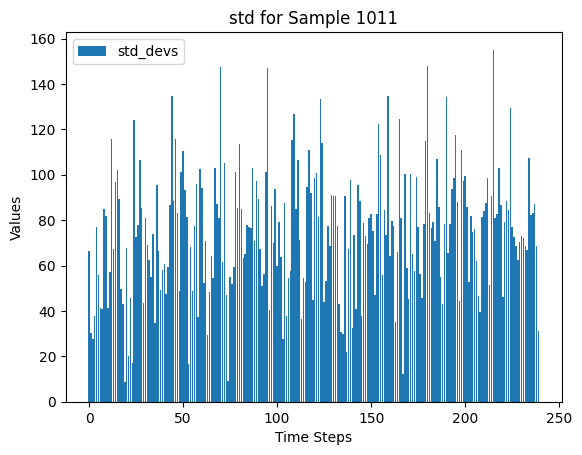

测试集上第1211个样本的MAE: 122.603226
测试集上第1211个样本的MSE: 28209.541


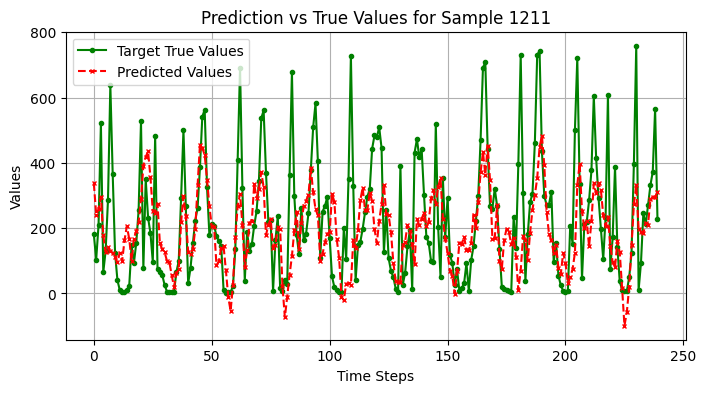

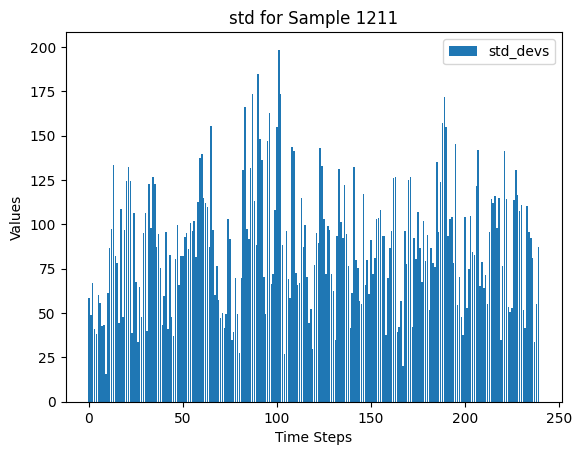

测试集上第1411个样本的MAE: 118.748634
测试集上第1411个样本的MSE: 26407.133


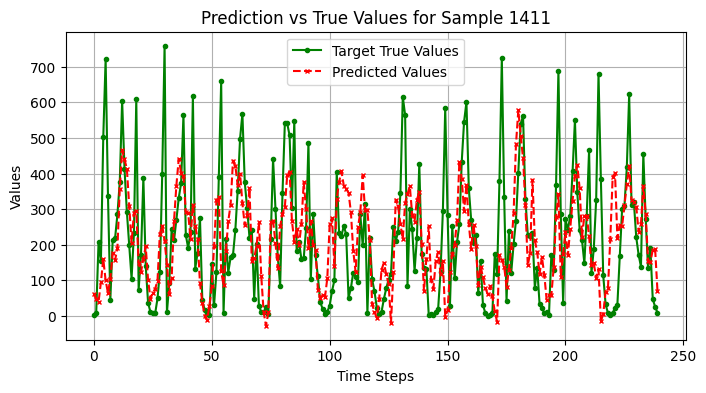

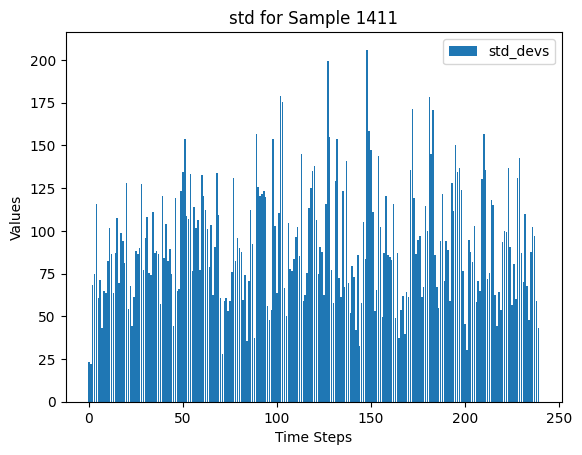

测试集上第1611个样本的MAE: 132.37457
测试集上第1611个样本的MSE: 27213.5


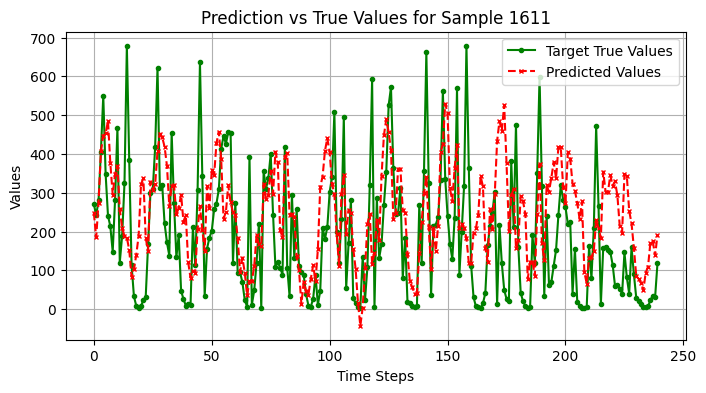

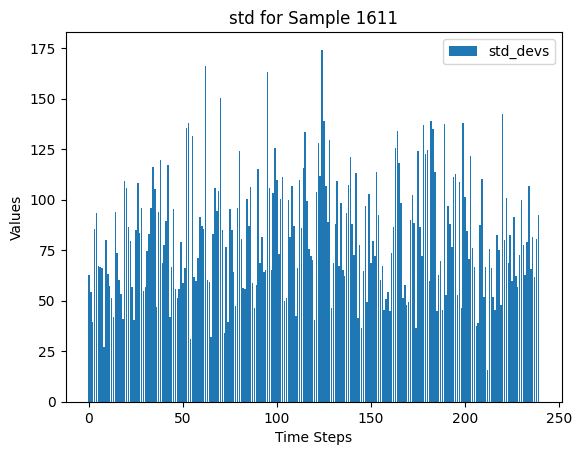

测试集上第1811个样本的MAE: 155.3725
测试集上第1811个样本的MSE: 33713.664


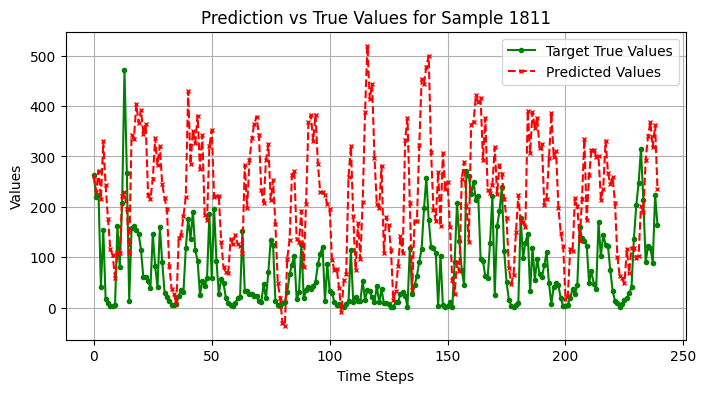

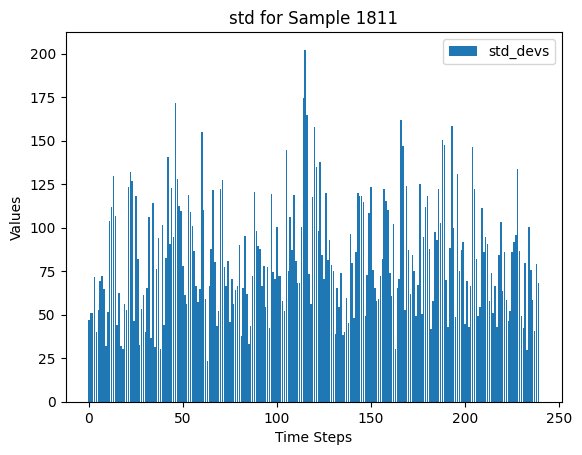

In [273]:
pred_array = np.load('pred_array_lstm.npy')
true_array = np.load('true_lstm.npy')
std_devs = np.std(pred_array, axis=0)
mean_values = np.mean(pred_array, axis=0)
print(std_devs.shape,mean_values.shape)
print('5轮训练平均值:')
val_i = [10,210,410,610,810,1010,1210,1410,1610,1810]
for i in val_i:
    mae,mse = calculate(mean_values, true_array, i=i)
    print(f'测试集上第{i+1}个样本的MAE:', mae)
    print(f'测试集上第{i+1}个样本的MSE:', mse)
    draw_one_sample(mean_values, true_array, i = i)
    plt.bar(height = std_devs[i,:], label='std_devs',x=range(len(std_devs[i,:])))
    plt.legend()
    plt.title(f'std for Sample {i+1}')
    plt.xlabel('Time Steps')
    plt.ylabel('Values')
    plt.show()